# Tarea 4: Deep Convolutional Generative Adversarial Networks (GANs)

Aprendizaje de Máquina I, 2020

Oscar Esaú Peralta Rosales

Maestría en Ciencias con Especialidad en Computación


Las redes tipo Generative Adversarial Networks son dos modelos que se entrenan simultaneamente en un proceso de competencia. El primer modelo (un generador) aprende a crear imágenes que luzcan lo más reales posibles mientras que el otro modelo (un discriminador) aprende a identificar si una imagen es real o falsa. El proceso alcanza el equilibrio cuando el discriminador ya no le es posible distinguir de entre las imágenes reales y falsas.

*Fuentes* y ejemplos para implementación

- http://personal.cimat.mx:8181/~mrivera/cursos/aprendizaje_profundo/dcgan/dcgan.html

- https://www.tensorflow.org/tutorials/generative/dcgan

- 

In [0]:
!pip install gdown tqdm

In [0]:
import os
import time

import gdown
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from IPython import display

import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator


from tensorflow.keras import backend as kbk
from tensorflow.keras.datasets import mnist
from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, Dropout
from tensorflow.keras.layers import BatchNormalization, ZeroPadding2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import Conv2D, Conv2DTranspose

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model

## Carga de Datos

In [0]:
# # Descargar los datos a colab si es necesario

# url = "https://drive.google.com/uc?id=1o4xZBKby3UKv4siW6Jwv21OAvezVHrIl"
# output = 'img_align_celeba.zip'
# gdown.download(url, output, quiet=False)

# !unzip -qq img_align_celeba.zip -d data

In [0]:
PATH = './data'
IMG_SHAPE = (64, 64, 3)

BUFFER_SIZE = 60000
BATCH_SIZE = 256
N_BATCH = int(BUFFER_SIZE / BATCH_SIZE)
NOISE_DIM = 100

In [0]:
def load_image(file_path, resize=(64, 64)):
    img = cv2.imread(file_path)
    img = cv2.resize(img, resize)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

def load_images(path, maximgs=60000):
    files = os.listdir(path)[:maximgs]
    imgs = np.array([load_image(path + '/' +fname) for fname in files])
    return imgs

In [0]:
def get_image_generator(path, resize=(64, 64), batch_size=32):
    images = load_images(path, maximgs=BUFFER_SIZE)

    for i in range(N_BATCH):
        yield images[i*BATCH_SIZE:(i+1)*BATCH_SIZE], None

    datagen = ImageDataGenerator(rescale=1./255,
                                 rotation_range=-30,
                                 horizontal_flip=True)
    
    return datagen.flow(images, 
                        np.ones(len(images)),
                        batch_size=batch_size)


def get_image_generator_from_path(path, resize=(128, 128), batch_size=32):
    datagen = ImageDataGenerator(rescale=1./255,
                                 rotation_range=-30,
                                 horizontal_flip=True)
    return datagen.flow_from_directory(path, 
                                       target_size=resize, 
                                       color_mode='rgb', 
                                       batch_size=batch_size)


In [0]:
# img_gen = get_image_generator_from_path(PATH, resize=(IMG_SHAPE[0], IMG_SHAPE[1]), batch_size=BATCH_SIZE)
img_gen = get_image_generator('./data/img_align_celeba', 
                              resize=(IMG_SHAPE[0], IMG_SHAPE[1]), 
                              batch_size=BATCH_SIZE)

Ejemplo de imagen desde el generador

(256, 64, 64, 3)


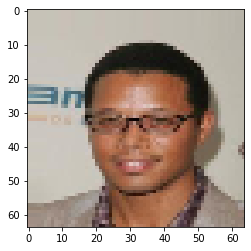

231 0


In [0]:
x_batch, y_batch = next(img_gen)
print(x_batch.shape)
plt.imshow(x_batch[0])
plt.show()
print(np.max(x_batch[0]), np.min(x_batch[0]))

## Generador 

In [0]:
NOISE_DIM = 100 # Dimension del ruido

In [0]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(NOISE_DIM,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((8, 8, 256)))
    assert model.output_shape == (None, 8, 8, 256) # Note: None is the batch size
    
    model.add(layers.Conv2DTranspose(128, (3, 3), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 8, 8, 128)
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(0.5))
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 16, 16, 64)
    model.add(layers.BatchNormalization())
    # model.add(layers.Dropout(0.15))
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(32, (3, 3), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 32, 32, 32)
    model.add(layers.BatchNormalization())
    # model.add(layers.Dropout(0.15))
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (3, 3), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 64, 64, 3)

    return model

0.48032504 0.51783776


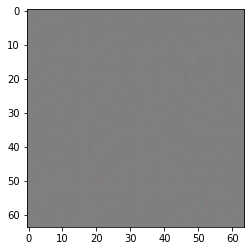

In [0]:
generator = make_generator_model()

noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)
generated_image = (generated_image + 1.0) / 2.0
print(np.min(generated_image), np.max(generated_image))
# plt.imshow(generated_image[0, :, :, 0], cmap='gray')
plt.imshow(generated_image[0])

## Discriminador

In [0]:
def make_discriminator_model():
    model = tf.keras.Sequential()

    model.add(layers.Conv2D(32, (3, 3), strides=(2, 2), padding='same', input_shape=[64, 64, 3]))
    # model.add(layers.BatchNormalization())
    # model.add(layers.Dropout(0.3))
    model.add(layers.LeakyReLU(alpha=0.2))

    model.add(layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same', input_shape=[64, 64, 3]))
    # model.add(layers.BatchNormalization())
    model.add(layers.Dropout(0.3))
    model.add(layers.LeakyReLU(alpha=0.1))

    model.add(layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
    # model.add(layers.BatchNormalization())
    model.add(layers.Dropout(0.3))
    model.add(layers.LeakyReLU(alpha=0.1))

    model.add(layers.Conv2D(256, (3, 3), strides=(2, 2), padding='same'))
    # model.add(layers.BatchNormalization())
    # model.add(layers.Dropout(0.3))
    model.add(layers.LeakyReLU(alpha=0.1))

    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation='sigmoid'))

    return model


In [0]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[0.4982512]], shape=(1, 1), dtype=float32)


## Funciones de Costo y Optimizadores

In [0]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [0]:
def discriminator_loss(real_output, fake_output, factor=0.5):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return factor * total_loss

In [0]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [0]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)
# generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
# discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.00004, beta_1=0.5)

## Entrenamiento

In [0]:
EPOCHS = 50
num_examples_to_generate = 16

In [0]:
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, NOISE_DIM])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

In [0]:
images = load_images('./data/img_align_celeba', maximgs=BUFFER_SIZE)

def get_img():
    for i in range(N_BATCH):
        yield images[i*BATCH_SIZE:(i+1)*BATCH_SIZE], None

def train(dataset, epochs):
    for epoch in range(epochs):
        start = time.time()
        
        dataset = get_img()

        for i in tqdm(range(N_BATCH)):
            image_batch, _ = next(dataset)
            image_batch = image_batch * 2.0 - 1.0 # Para poner en rango de -1 a 1
            train_step(image_batch)

        # display.clear_output(wait=True)
        generate_and_save_images(generator, epoch + 1)

        print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

    # display.clear_output(wait=True)
    generate_and_save_images(generator, epochs)

In [0]:
def generate_and_save_images(model, epoch, test_input=None, save=True):
    if test_input is None:
        test_input = tf.random.normal([num_examples_to_generate, NOISE_DIM])
    predictions = model(test_input, training=False)
    predictions = (predictions + 1.0) / 2.0

    fig = plt.figure(figsize=(6,6))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow(predictions[i])
        plt.axis('off')

    if save:
        plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))

    plt.show()

### Entrenamiento!

100%|██████████| 234/234 [00:12<00:00, 18.25it/s]


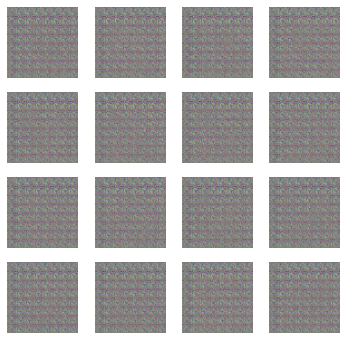

  1%|▏         | 3/234 [00:00<00:08, 26.81it/s]

Time for epoch 1 is 13.694535255432129 sec


100%|██████████| 234/234 [00:10<00:00, 22.24it/s]


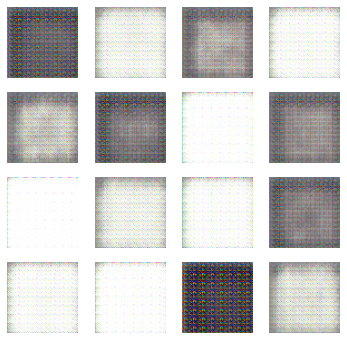

  1%|▏         | 3/234 [00:00<00:08, 27.28it/s]

Time for epoch 2 is 11.251222610473633 sec


100%|██████████| 234/234 [00:10<00:00, 22.32it/s]


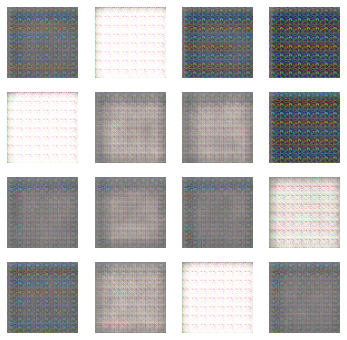

  1%|▏         | 3/234 [00:00<00:08, 26.11it/s]

Time for epoch 3 is 11.213610172271729 sec


100%|██████████| 234/234 [00:10<00:00, 22.32it/s]


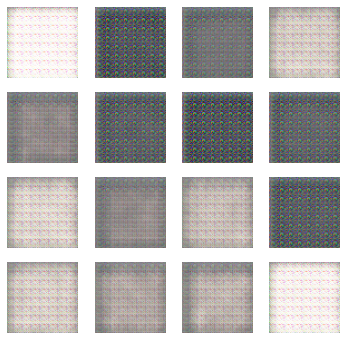

  1%|▏         | 3/234 [00:00<00:08, 26.87it/s]

Time for epoch 4 is 11.352964401245117 sec


100%|██████████| 234/234 [00:10<00:00, 22.31it/s]


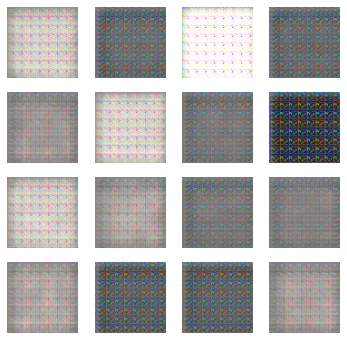

  1%|▏         | 3/234 [00:00<00:08, 26.60it/s]

Time for epoch 5 is 11.201408386230469 sec


100%|██████████| 234/234 [00:10<00:00, 22.31it/s]


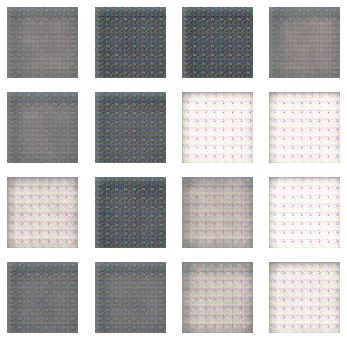

  1%|▏         | 3/234 [00:00<00:08, 25.75it/s]

Time for epoch 6 is 11.234858751296997 sec


100%|██████████| 234/234 [00:10<00:00, 22.27it/s]


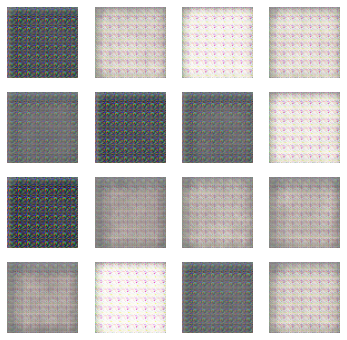

  1%|▏         | 3/234 [00:00<00:08, 27.13it/s]

Time for epoch 7 is 11.436268091201782 sec


100%|██████████| 234/234 [00:10<00:00, 22.34it/s]


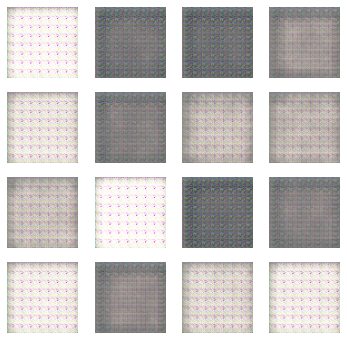

  1%|▏         | 3/234 [00:00<00:08, 27.81it/s]

Time for epoch 8 is 11.19094443321228 sec


100%|██████████| 234/234 [00:10<00:00, 22.35it/s]


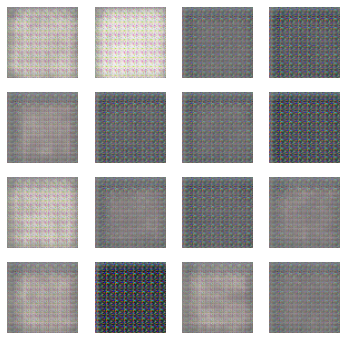

  1%|▏         | 3/234 [00:00<00:08, 25.79it/s]

Time for epoch 9 is 11.221224308013916 sec


100%|██████████| 234/234 [00:10<00:00, 22.34it/s]


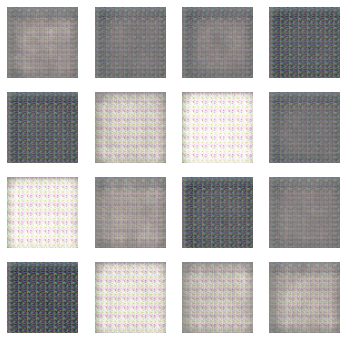

  1%|▏         | 3/234 [00:00<00:08, 26.38it/s]

Time for epoch 10 is 11.329921007156372 sec


100%|██████████| 234/234 [00:10<00:00, 22.30it/s]


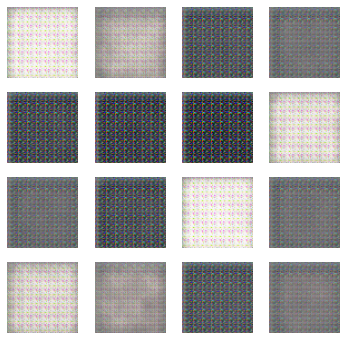

  1%|▏         | 3/234 [00:00<00:08, 27.44it/s]

Time for epoch 11 is 11.199585437774658 sec


100%|██████████| 234/234 [00:10<00:00, 22.30it/s]


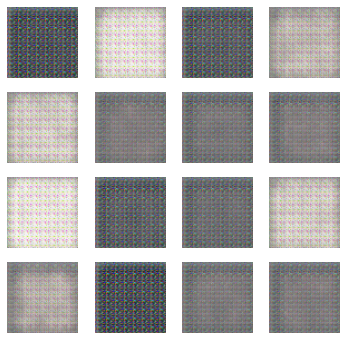

  1%|▏         | 3/234 [00:00<00:08, 26.67it/s]

Time for epoch 12 is 11.358145713806152 sec


100%|██████████| 234/234 [00:10<00:00, 22.31it/s]


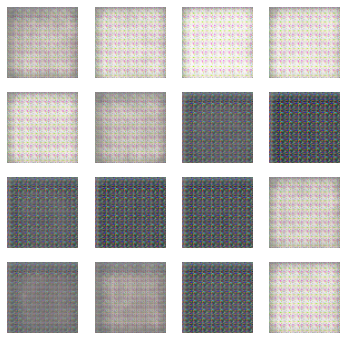

  1%|▏         | 3/234 [00:00<00:08, 27.12it/s]

Time for epoch 13 is 11.184476613998413 sec


100%|██████████| 234/234 [00:10<00:00, 22.34it/s]


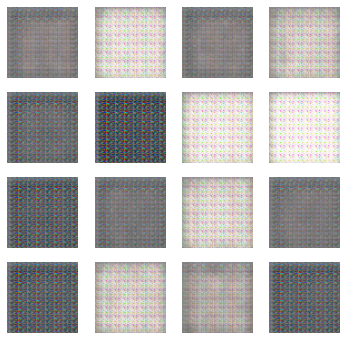

  1%|▏         | 3/234 [00:00<00:08, 26.74it/s]

Time for epoch 14 is 11.180188179016113 sec


100%|██████████| 234/234 [00:10<00:00, 22.33it/s]


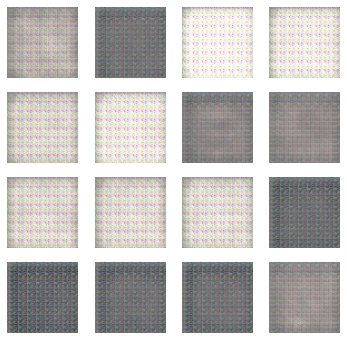

  1%|▏         | 3/234 [00:00<00:08, 26.89it/s]

Time for epoch 15 is 11.348313093185425 sec


100%|██████████| 234/234 [00:10<00:00, 22.30it/s]


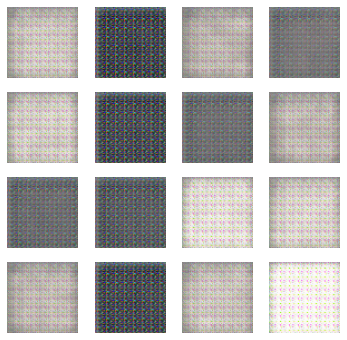

  1%|▏         | 3/234 [00:00<00:08, 27.42it/s]

Time for epoch 16 is 11.248136281967163 sec


100%|██████████| 234/234 [00:10<00:00, 22.35it/s]


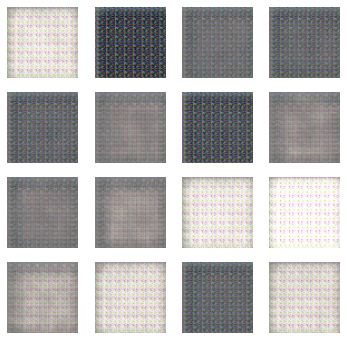

  1%|▏         | 3/234 [00:00<00:08, 27.16it/s]

Time for epoch 17 is 11.205563068389893 sec


100%|██████████| 234/234 [00:10<00:00, 22.46it/s]


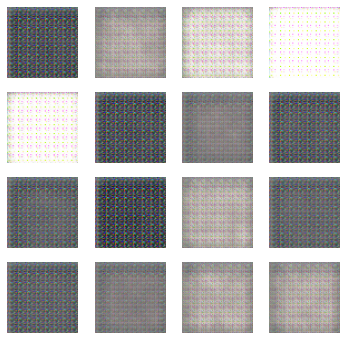

  1%|▏         | 3/234 [00:00<00:08, 26.62it/s]

Time for epoch 18 is 11.270131349563599 sec


100%|██████████| 234/234 [00:10<00:00, 22.32it/s]


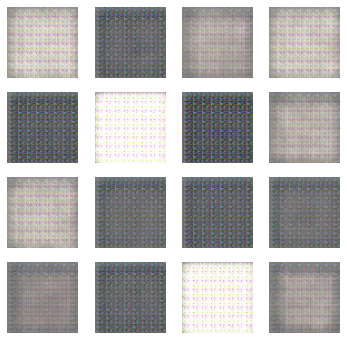

  1%|▏         | 3/234 [00:00<00:08, 26.23it/s]

Time for epoch 19 is 11.203993082046509 sec


100%|██████████| 234/234 [00:10<00:00, 22.33it/s]


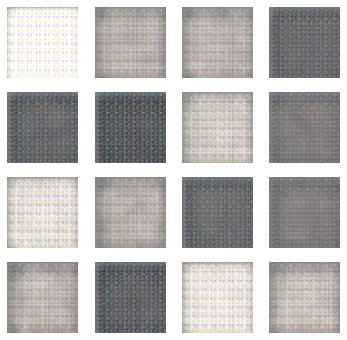

  1%|▏         | 3/234 [00:00<00:08, 26.27it/s]

Time for epoch 20 is 11.200554847717285 sec


100%|██████████| 234/234 [00:10<00:00, 22.29it/s]


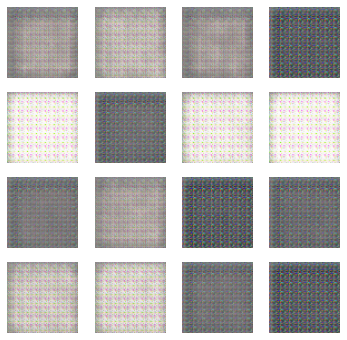

  1%|▏         | 3/234 [00:00<00:08, 27.03it/s]

Time for epoch 21 is 11.365540266036987 sec


100%|██████████| 234/234 [00:10<00:00, 22.33it/s]


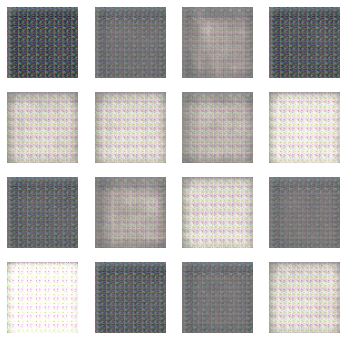

  1%|▏         | 3/234 [00:00<00:08, 27.43it/s]

Time for epoch 22 is 11.19246244430542 sec


100%|██████████| 234/234 [00:10<00:00, 22.38it/s]


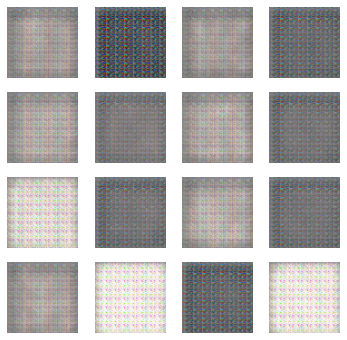

  1%|▏         | 3/234 [00:00<00:08, 26.74it/s]

Time for epoch 23 is 11.20883321762085 sec


100%|██████████| 234/234 [00:10<00:00, 22.33it/s]


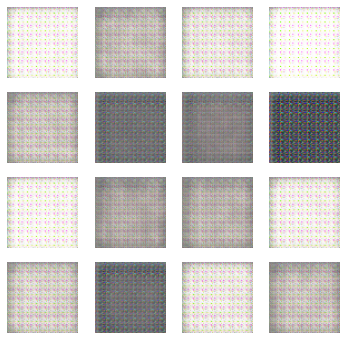

  1%|▏         | 3/234 [00:00<00:08, 27.44it/s]

Time for epoch 24 is 11.368731260299683 sec


100%|██████████| 234/234 [00:10<00:00, 22.36it/s]


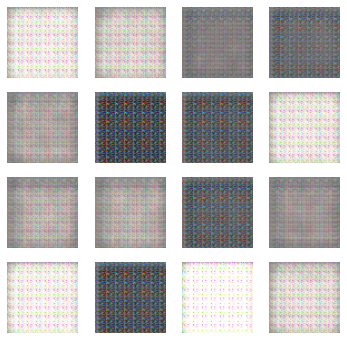

  1%|▏         | 3/234 [00:00<00:08, 26.56it/s]

Time for epoch 25 is 11.192498683929443 sec


100%|██████████| 234/234 [00:10<00:00, 22.33it/s]


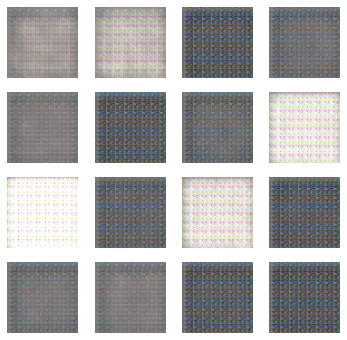

  1%|▏         | 3/234 [00:00<00:08, 27.41it/s]

Time for epoch 26 is 11.194092035293579 sec


100%|██████████| 234/234 [00:10<00:00, 22.28it/s]


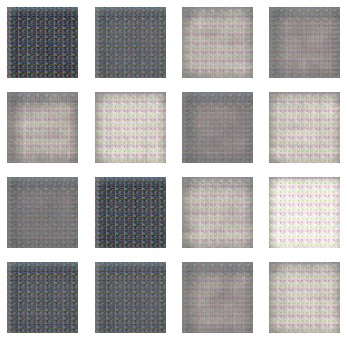

  1%|▏         | 3/234 [00:00<00:08, 27.18it/s]

Time for epoch 27 is 11.37851595878601 sec


100%|██████████| 234/234 [00:10<00:00, 22.36it/s]


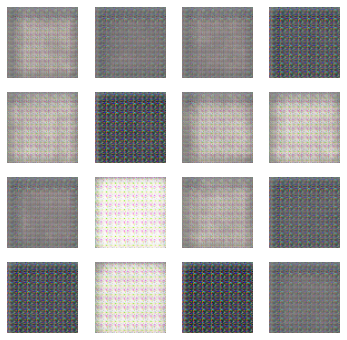

  1%|▏         | 3/234 [00:00<00:08, 27.25it/s]

Time for epoch 28 is 11.180747270584106 sec


100%|██████████| 234/234 [00:10<00:00, 22.29it/s]


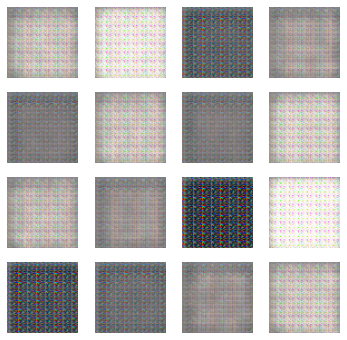

  1%|▏         | 3/234 [00:00<00:08, 27.24it/s]

Time for epoch 29 is 11.211758613586426 sec


100%|██████████| 234/234 [00:10<00:00, 22.31it/s]


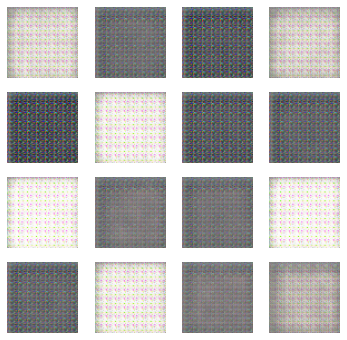

  1%|▏         | 3/234 [00:00<00:08, 27.30it/s]

Time for epoch 30 is 11.3508780002594 sec


100%|██████████| 234/234 [00:10<00:00, 22.30it/s]


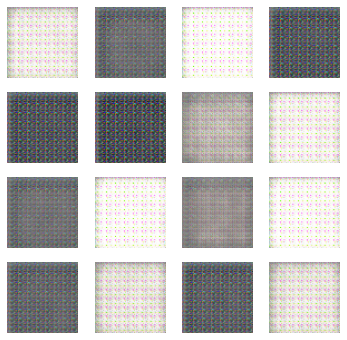

  1%|▏         | 3/234 [00:00<00:08, 26.77it/s]

Time for epoch 31 is 11.215859651565552 sec


100%|██████████| 234/234 [00:10<00:00, 22.30it/s]


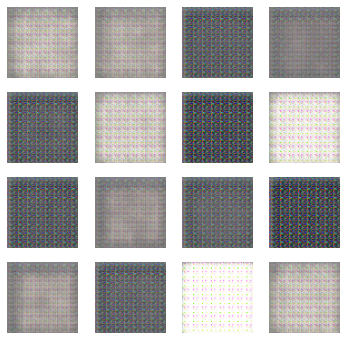

  1%|▏         | 3/234 [00:00<00:08, 27.05it/s]

Time for epoch 32 is 11.222543478012085 sec


100%|██████████| 234/234 [00:10<00:00, 22.30it/s]


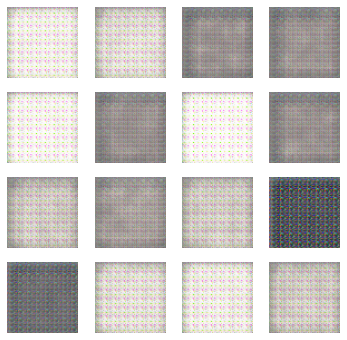

  1%|▏         | 3/234 [00:00<00:08, 26.97it/s]

Time for epoch 33 is 11.393945455551147 sec


100%|██████████| 234/234 [00:10<00:00, 22.28it/s]


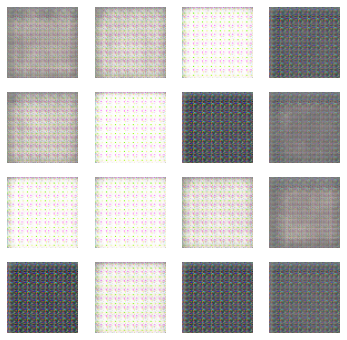

  1%|▏         | 3/234 [00:00<00:08, 26.72it/s]

Time for epoch 34 is 11.272591352462769 sec


100%|██████████| 234/234 [00:10<00:00, 22.30it/s]


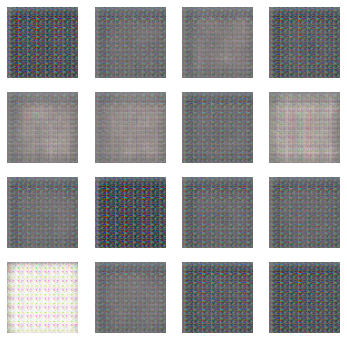

  1%|▏         | 3/234 [00:00<00:08, 26.90it/s]

Time for epoch 35 is 11.229925394058228 sec


100%|██████████| 234/234 [00:10<00:00, 22.37it/s]


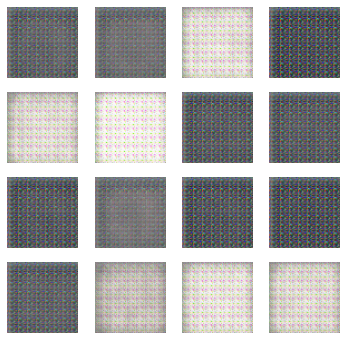

  1%|▏         | 3/234 [00:00<00:08, 26.86it/s]

Time for epoch 36 is 11.328493118286133 sec


100%|██████████| 234/234 [00:10<00:00, 22.34it/s]


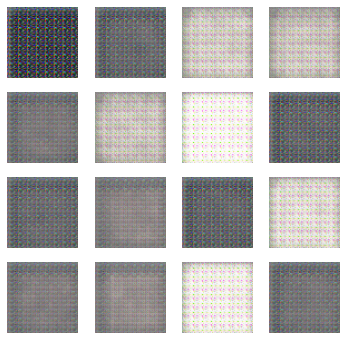

  1%|▏         | 3/234 [00:00<00:08, 27.24it/s]

Time for epoch 37 is 11.212546110153198 sec


100%|██████████| 234/234 [00:10<00:00, 22.37it/s]


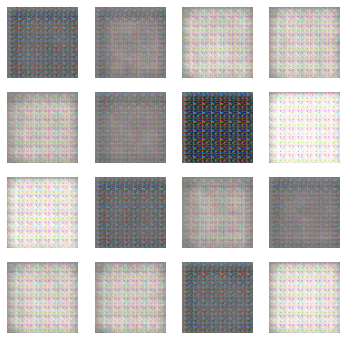

  1%|▏         | 3/234 [00:00<00:08, 27.29it/s]

Time for epoch 38 is 11.202448844909668 sec


100%|██████████| 234/234 [00:10<00:00, 22.33it/s]


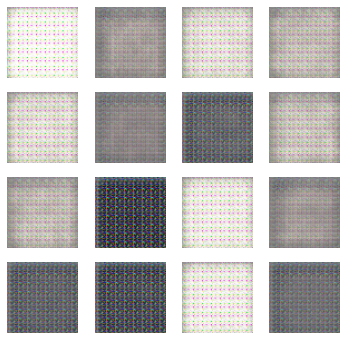

  1%|▏         | 3/234 [00:00<00:08, 27.56it/s]

Time for epoch 39 is 11.344419240951538 sec


100%|██████████| 234/234 [00:10<00:00, 22.35it/s]


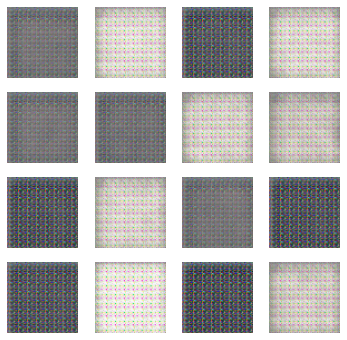

  1%|▏         | 3/234 [00:00<00:08, 27.26it/s]

Time for epoch 40 is 11.196329832077026 sec


100%|██████████| 234/234 [00:10<00:00, 22.35it/s]


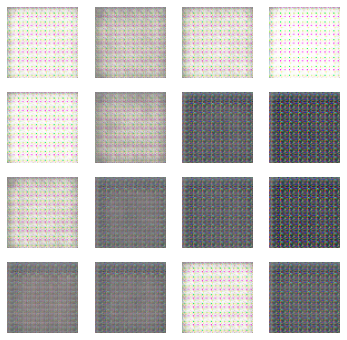

  1%|▏         | 3/234 [00:00<00:08, 27.45it/s]

Time for epoch 41 is 11.212210416793823 sec


100%|██████████| 234/234 [00:10<00:00, 22.35it/s]


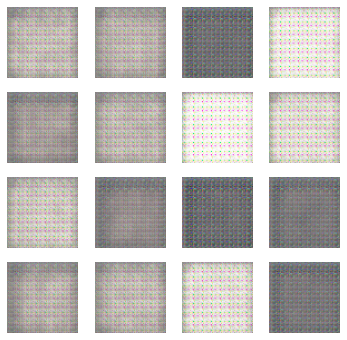

  1%|▏         | 3/234 [00:00<00:08, 27.05it/s]

Time for epoch 42 is 11.352579355239868 sec


100%|██████████| 234/234 [00:10<00:00, 22.29it/s]


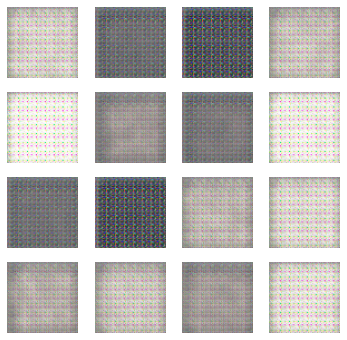

  1%|▏         | 3/234 [00:00<00:08, 27.08it/s]

Time for epoch 43 is 11.202272891998291 sec


100%|██████████| 234/234 [00:10<00:00, 22.32it/s]


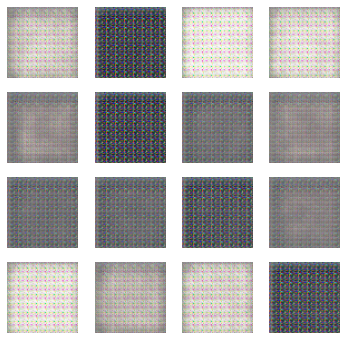

  1%|▏         | 3/234 [00:00<00:08, 27.66it/s]

Time for epoch 44 is 11.17526125907898 sec


100%|██████████| 234/234 [00:10<00:00, 22.32it/s]


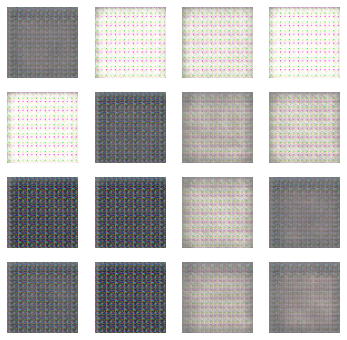

  1%|▏         | 3/234 [00:00<00:08, 27.50it/s]

Time for epoch 45 is 11.34918475151062 sec


100%|██████████| 234/234 [00:10<00:00, 22.31it/s]


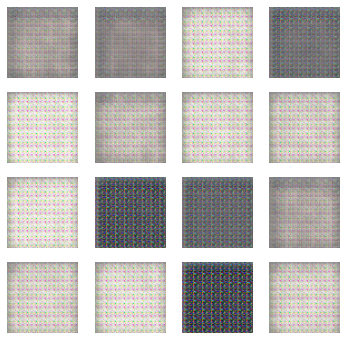

  1%|▏         | 3/234 [00:00<00:08, 26.61it/s]

Time for epoch 46 is 11.215450763702393 sec


100%|██████████| 234/234 [00:10<00:00, 22.37it/s]


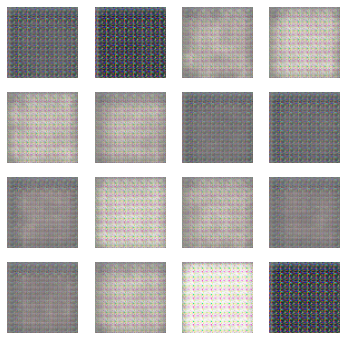

  1%|▏         | 3/234 [00:00<00:08, 26.93it/s]

Time for epoch 47 is 11.179972887039185 sec


100%|██████████| 234/234 [00:10<00:00, 22.25it/s]


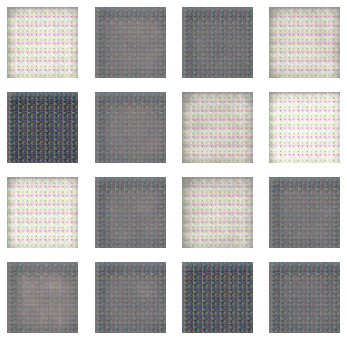

  1%|▏         | 3/234 [00:00<00:08, 26.78it/s]

Time for epoch 48 is 11.384484052658081 sec


100%|██████████| 234/234 [00:10<00:00, 22.35it/s]


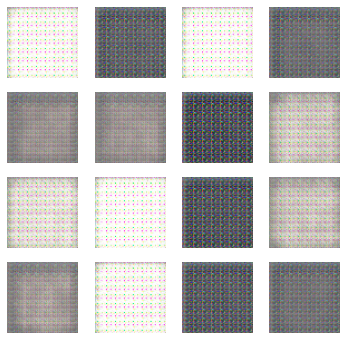

  1%|▏         | 3/234 [00:00<00:08, 27.17it/s]

Time for epoch 49 is 11.195977449417114 sec


100%|██████████| 234/234 [00:10<00:00, 22.32it/s]


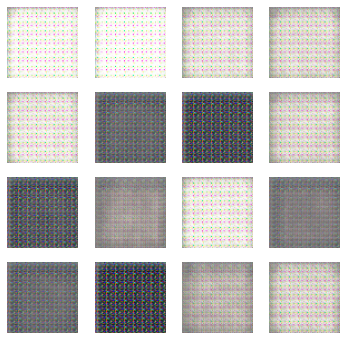

Time for epoch 50 is 11.18905520439148 sec


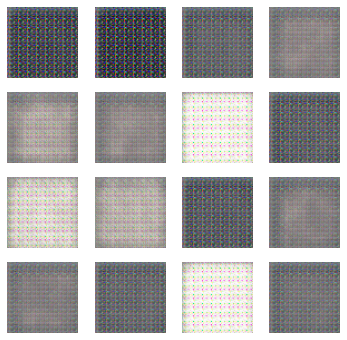

In [0]:
# kbk.clear_session() # To reset all, (weights)
display.clear_output(wait=True)
train(img_gen, EPOCHS)